# (1) Central limit theorem
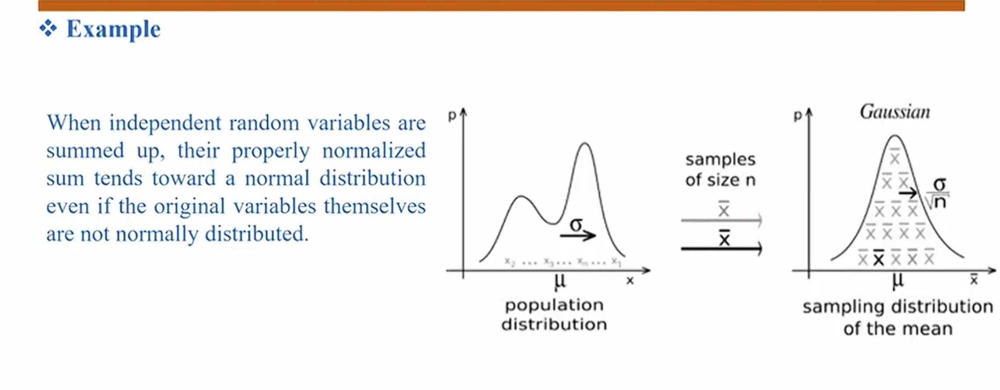
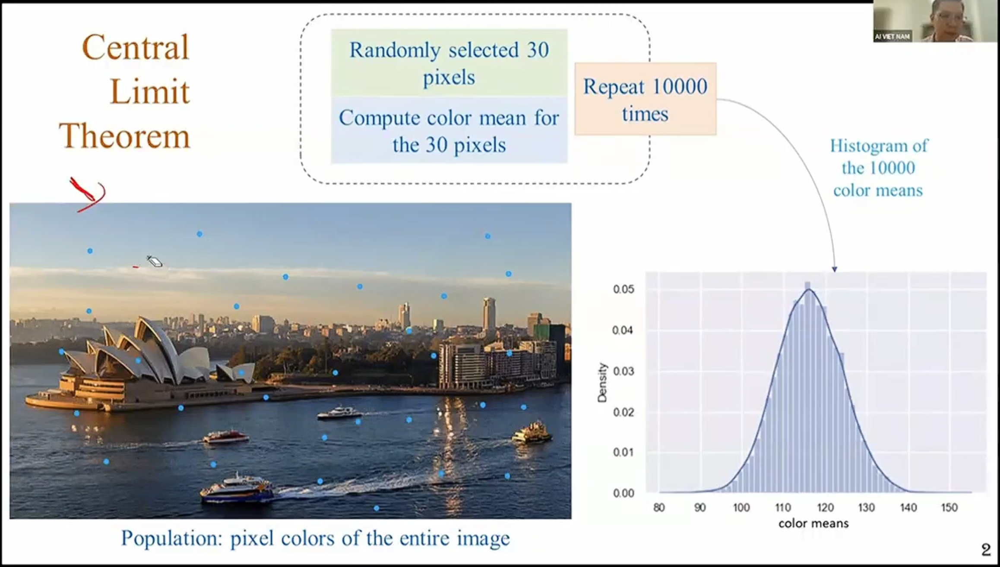


In [ ]:
import cv2

img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\mrbean.jpeg')
print(img.shape)

(496, 660, 3)


In [2]:
img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\mrbean.jpeg', 0)
height, width = img.shape
print(height, width)

496 660


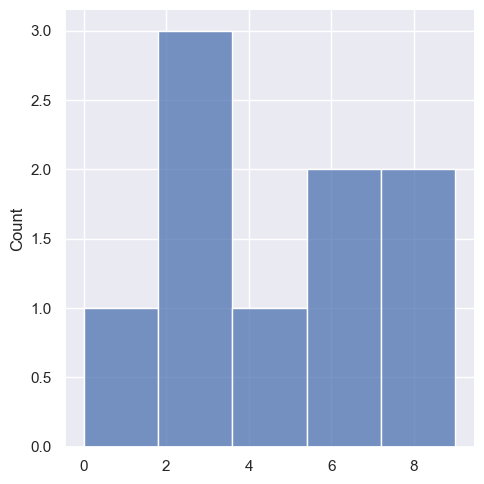

In [3]:
import seaborn as sns
import random

sns.set_theme()

data = [5, 3, 8, 7, 3, 2, 7, 0, 9]
sns.displot(data)

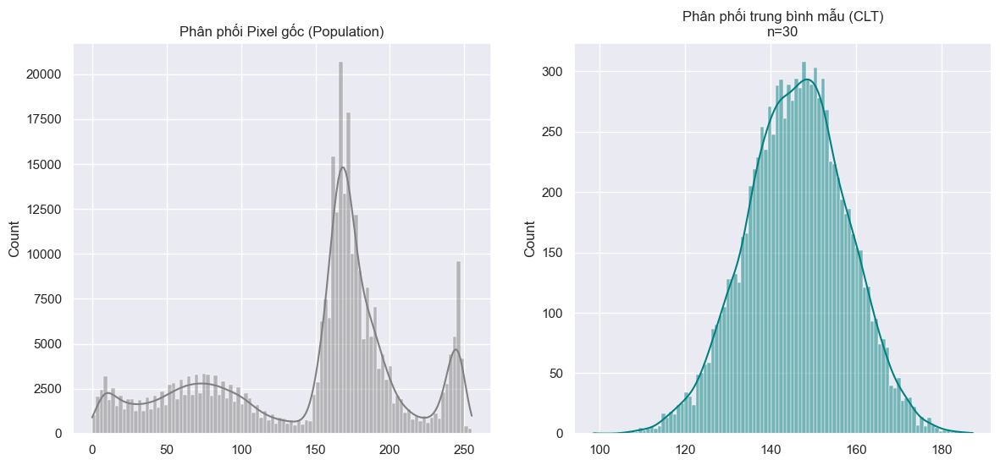

In [9]:
import seaborn as sns
import random
import matplotlib.pyplot as plt
import numpy as np
sns.set_theme()

# Load image
img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\mrbean.jpeg', 0)
img = img.astype(np.float64)

height, width = img.shape
pixels = img.flatten()

num_of_samples = 10000
sample_size = 30

means = []
for _ in range(num_of_samples):
    current_sample_sum = 0

    for _ in range(sample_size):
        x = random.randint(0, height - 1)
        y = random.randint(0, width - 1)
        current_sample_sum += img[x][y]
    
    sample_mean = current_sample_sum / sample_size
    means.append(sample_mean)

plt.figure(figsize=(14, 6))

# Biểu đồ gốc
plt.subplot(1, 2, 1)
sns.histplot(pixels, kde=True, color='gray', bins=100)
plt.title("Phân phối Pixel gốc (Population)")

# Biểu đồ trung bình mẫu (CLT)
plt.subplot(1, 2, 2)
sns.histplot(means, kde=True, color='teal', bins=100)
plt.title(f"Phân phối trung bình mẫu (CLT)\nn={sample_size}")

plt.show()


# (2) Mean and its Application
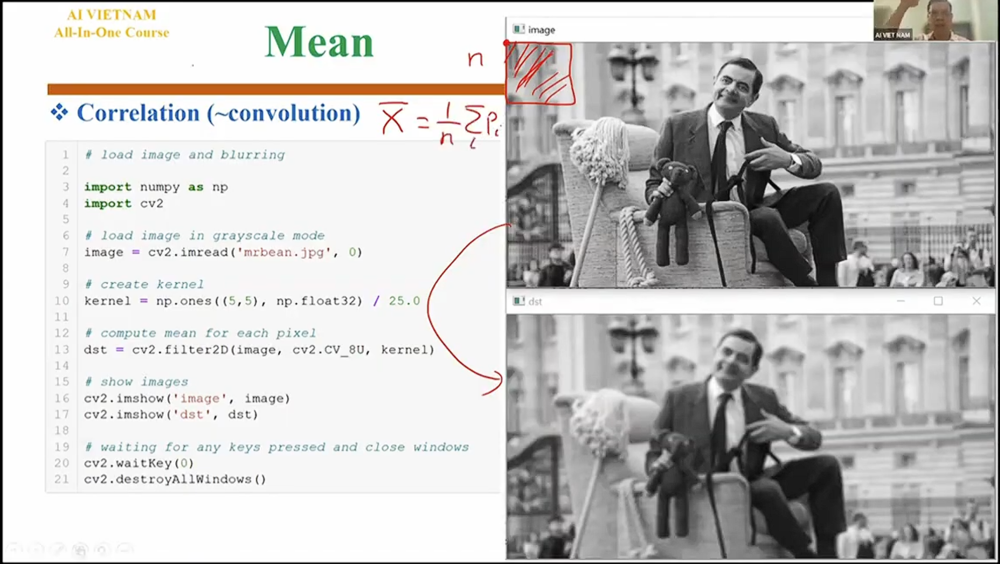

1. Ý tưởng chính: Mean (Trung bình)
    - Công thức: $\bar{X} = \frac{1}{n} \sum P_i$
        - Đây là công thức tính trung bình cộng.
        - Trong xử lý ảnh, $P_i$ là giá trị của các pixel nằm trong một vùng nhỏ (cửa sổ).
        - $n$ là tổng số pixel trong vùng đó.
        - Ý nghĩa: Để làm mờ ảnh, ta thay thế giá trị của mỗi pixel bằng giá trị trung bình của các pixel xung quanh nó.

(np.float64(-0.5), np.float64(659.5), np.float64(495.5), np.float64(-0.5))

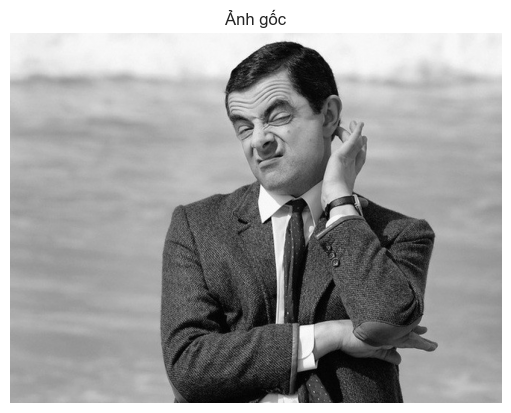

In [11]:
img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\mrbean.jpeg', 0)
plt.imshow(img, cmap='gray')
plt.title('Ảnh gốc')
plt.axis('off')

Text(0.5, 1.0, 'Ảnh Mean Filter (10x10)')

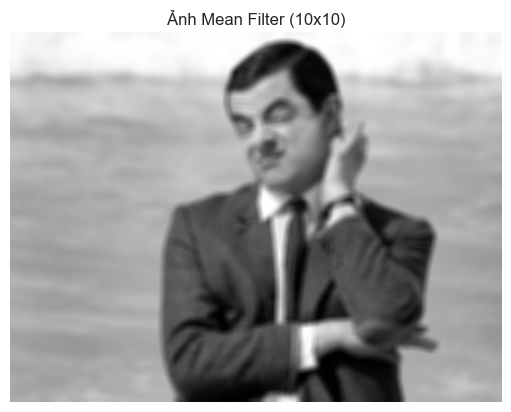

In [17]:
# Tạo kernel 5x5 và chia cho 25
kernel = np.ones((10, 10), np.float32) / 100.0
dst = cv2.filter2D(img, cv2.CV_8U, kernel)
plt.imshow(dst, cmap='gray')
plt.axis('off')
plt.title('Ảnh Mean Filter (10x10)')

1. Tạo Kernel (Ma trận lọc)
- kernel = np.ones((5,5), np.float32) / 25.0: Đây là bước quan trọng nhất. Chúng ta đang tạo ra một "chiếc khuôn" hình vuông kích thước $5 \times 5$.
    - np.ones((5,5)): Tạo ra ma trận toàn số 1.
    - / 25.0: Tại sao phải chia cho 25?
        - Vì $5 \times 5 = 25$ ô.
        - Khi nhân ma trận này với vùng ảnh $5 \times 5$, ta sẽ cộng tổng giá trị của 25 pixel lại.
        - Để ra giá trị Trung bình (Mean), ta bắt buộc phải chia cho tổng số phần tử (là 25).

2. Hàm cv2.filter2D
- Hàm này thực hiện hành động trượt cái khuôn (kernel) đi khắp bức ảnh từ trái qua phải, từ trên xuống dưới.
    - Tại mỗi vị trí, nó lấy 25 pixel xung quanh, nhân với kernel (đã chia 25), rồi cộng lại.
    - Kết quả là pixel ở giữa sẽ mang giá trị trung bình của hàng xóm nó.
    - Hệ quả: Các chi tiết sắc cạnh (như sợi tóc, nếp nhăn) sẽ bị hòa trộn với xung quanh $\rightarrow$ Ảnh bị mờ đi.

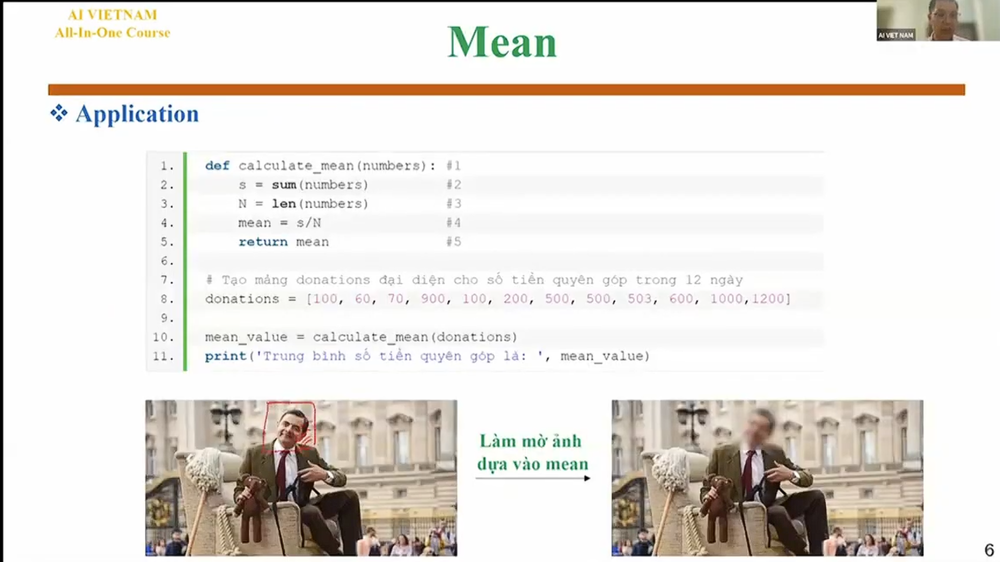
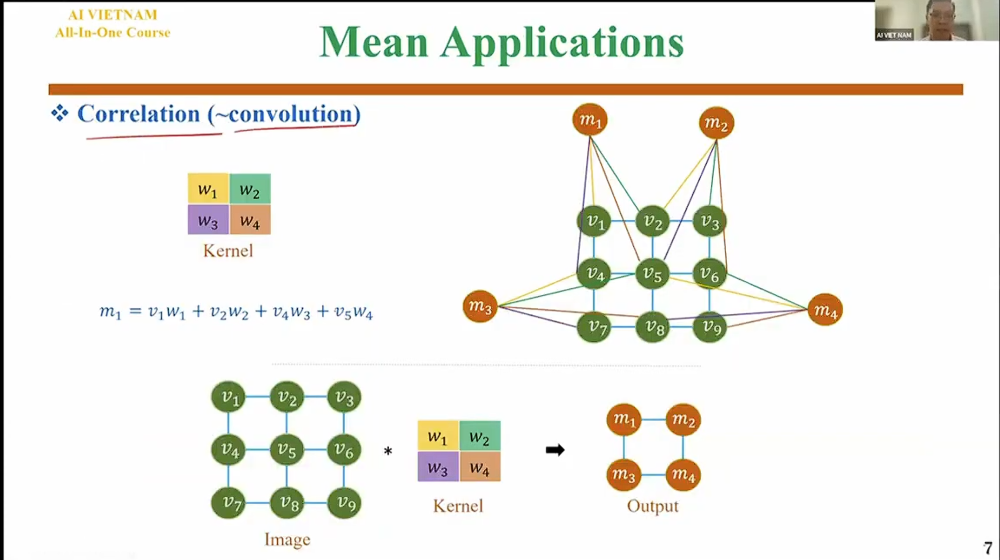
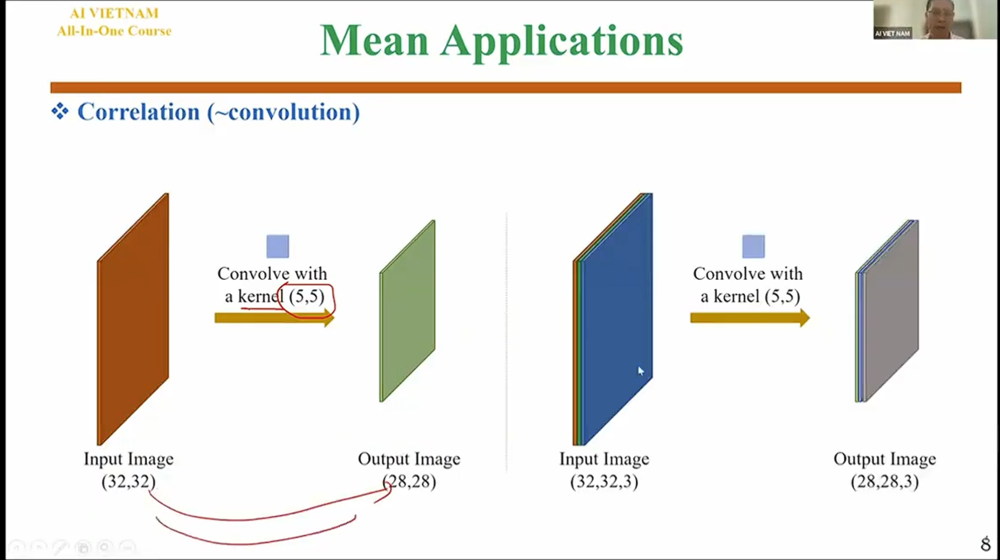
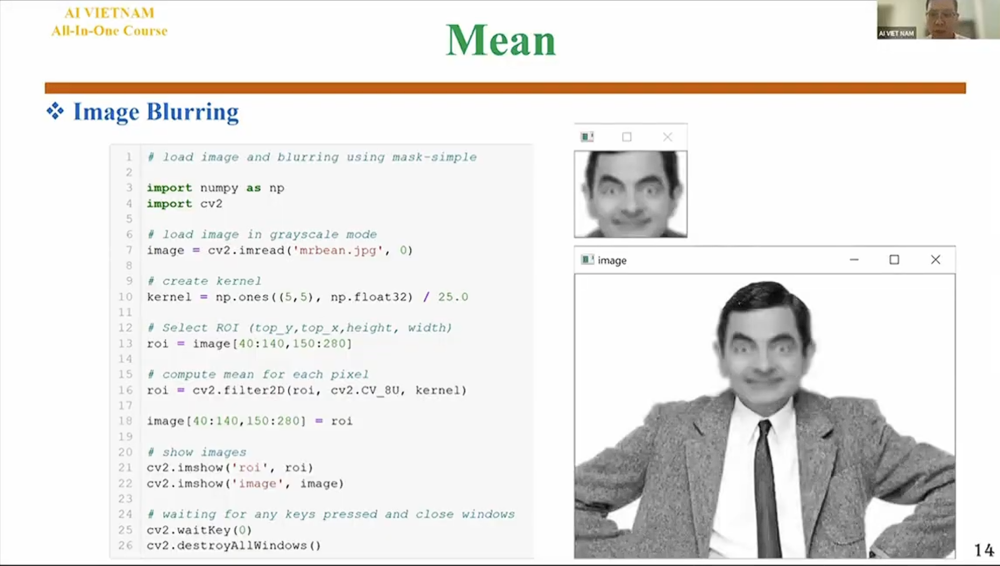

(np.float64(-0.5), np.float64(659.5), np.float64(495.5), np.float64(-0.5))

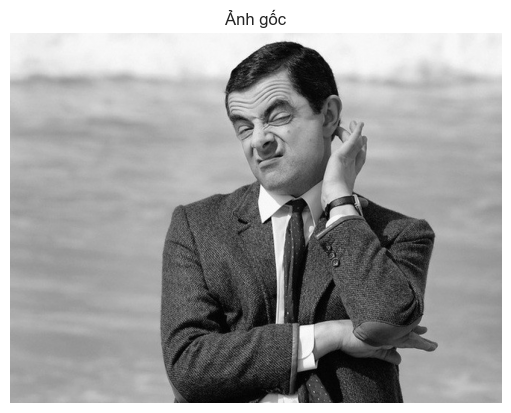

In [18]:
img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\mrbean.jpeg', 0)
plt.imshow(img, cmap='gray')
plt.title('Ảnh gốc')
plt.axis('off')

(np.float64(-0.5), np.float64(159.5), np.float64(189.5), np.float64(-0.5))

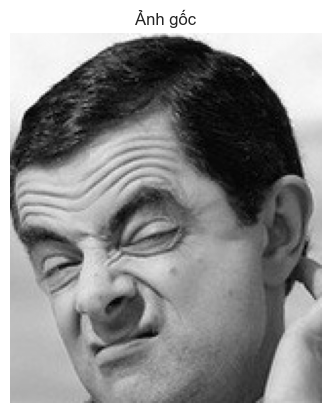

In [ ]:
roi = img[10:200, 290:450]
plt.imshow(roi, cmap='gray')
plt.title('Ảnh mặt')
plt.axis('off')

(np.float64(-0.5), np.float64(659.5), np.float64(495.5), np.float64(-0.5))

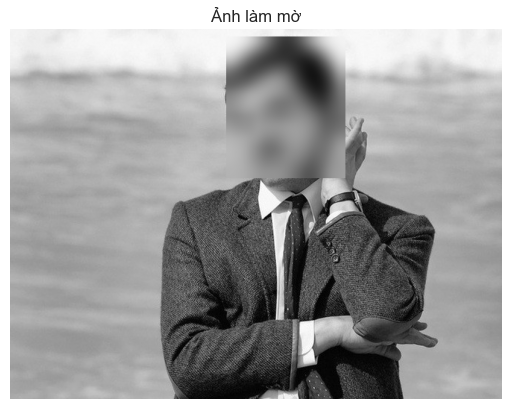

In [39]:
kernel = np.ones((30,30), np.float32) / 900.0
blurred_face = cv2.filter2D(roi, cv2.CV_8U, kernel)
img[10:200, 290:450] = blurred_face

plt.imshow(img, cmap='gray')
plt.title('Ảnh làm mờ')
plt.axis('off')

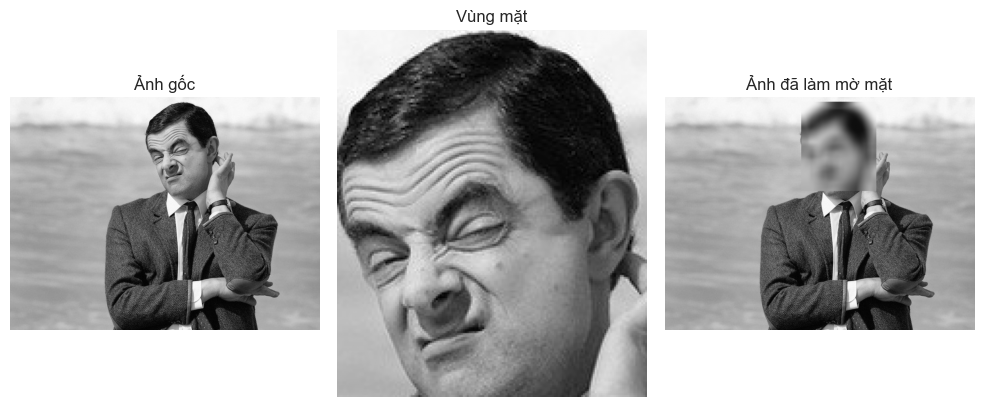

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ảnh
img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\mrbean.jpeg', 0)

# Hiển thị ảnh gốc
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Ảnh gốc')
plt.axis('off')

# 2. Cắt vùng khuôn mặt (ROI - Region of Interest)
roi = img[10:200, 290:450] 
# Hiển thị mặt cắt ra
plt.subplot(1, 3, 2)
plt.imshow(roi, cmap='gray')
plt.title('Vùng mặt')
plt.axis('off')

# 3. Tạo kernel và làm mờ
kernel_size = 30
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size**2)

# Áp dụng bộ lọc lên vùng ROI
blurred_face = cv2.filter2D(roi, -1, kernel)

# 4. Gán ngược vùng đã làm mờ vào ảnh gốc
img[10:200, 290:450] = blurred_face

plt.subplot(1, 3, 3)
plt.imshow(img, cmap='gray')
plt.title('Ảnh đã làm mờ mặt')
plt.axis('off')

plt.tight_layout()
plt.show()

Tìm thấy 4 khuôn mặt.


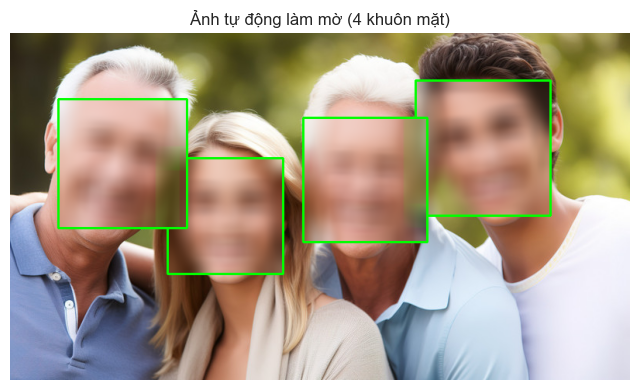

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# 1. Setup Face Detection
# Sử dụng cv2.data.haarcascades để tự động tìm đường dẫn file xml chuẩn trong thư viện
path_xml = cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
face_cascade = cv2.CascadeClassifier(path_xml)

# 2. Load ảnh
img_path = r'C:\Code_AI\AIO_Code\Module3\Statistics\2f916cdb70973ac1d0757f3497175cb7.jpg!sw800'
img = cv2.imread(img_path, 1) # 1 là đọc ảnh màu BGR

if img is None:
    print("Không tìm thấy ảnh!")
else:
    # Convert sang grayscale để detect mặt (nhanh và chính xác hơn)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 3. Detect faces
    # detectMultiScale trả về danh sách các tọa độ (x, y, w, h)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4)
    print(f"Tìm thấy {len(faces)} khuôn mặt.")

    # 4. Xử lý từng khuôn mặt tìm được
    for (x, y, w, h) in faces:
        # --- BƯỚC QUAN TRỌNG: LÀM MỜ ---
        
        # a. Cắt vùng mặt ra (ROI)
        roi = img[y:y+h, x:x+w]
        
        # b. Làm mờ vùng đó
        # Kernel (31, 31) là độ mạnh của việc làm mờ
        roi = cv2.blur(roi, (31, 31))
        
        # c. Gán ngược lại vào ảnh gốc
        img[y:y+h, x:x+w] = roi

        # d. (Tùy chọn) Vẽ thêm khung xanh để biết đã detect đúng
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # 5. Hiển thị bằng Matplotlib
    # QUAN TRỌNG: OpenCV dùng BGR, Matplotlib dùng RGB. Cần convert màu.
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.title(f'Ảnh tự động làm mờ ({len(faces)} khuôn mặt)')
    plt.axis('off')
    plt.show()

In [ ]:
import cv2

# 1. Khởi tạo bộ phát hiện khuôn mặt
path_xml = cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
face_cascade = cv2.CascadeClassifier(path_xml)

# 2. Mở kết nối với Webcam
# Số 0 thường là webcam mặc định của laptop. 
cap = cv2.VideoCapture(0)

# Kiểm tra xem webcam có mở được không
if not cap.isOpened():
    print("Không thể mở Webcam!")
    exit()

print("Đang chạy Webcam... Nhấn phím 'q' để thoát.")

while True:
    # 3. Đọc từng khung hình (frame) từ webcam
    ret, frame = cap.read()
    
    if not ret:
        print("Không nhận được tín hiệu hình ảnh.")
        break

    # 4. Chuyển sang ảnh xám để detect khuôn mặt (nhanh hơn)
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # 5. Phát hiện khuôn mặt
    faces = face_cascade.detectMultiScale(
        gray, 
        scaleFactor=1.1, 
        minNeighbors=5, 
        minSize=(30, 30)
    )

    # 6. Xử lý từng khuôn mặt tìm được
    for (x, y, w, h) in faces:
        # --- BƯỚC A: Cắt vùng khuôn mặt ra (ROI) ---
        # Lưu ý: frame[y, x] (trục tung trước, hoành sau)
        roi = frame[y:y+h, x:x+w]
        
        # --- BƯỚC B: Làm mờ vùng mặt đó ---
        blurred_roi = cv2.blur(roi, (31, 31))
        
        # --- BƯỚC C: Gán ngược lại vào khung hình gốc ---
        frame[y:y+h, x:x+w] = blurred_roi

        # Vẽ thêm khung xanh bao quanh để biết đang detect ở đâu
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # 7. Hiển thị kết quả lên màn hình
    cv2.imshow('Webcam Face Blur (Press Q to exit)', frame)

    # 8. Xử lý sự kiện nhấn phím
    # Nếu nhấn phím 'q' thì thoát vòng lặp
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break 
    
cap.release()
cv2.destroyAllWindows()

Đang chạy Webcam... Nhấn phím 'q' để thoát.


# (3) Median
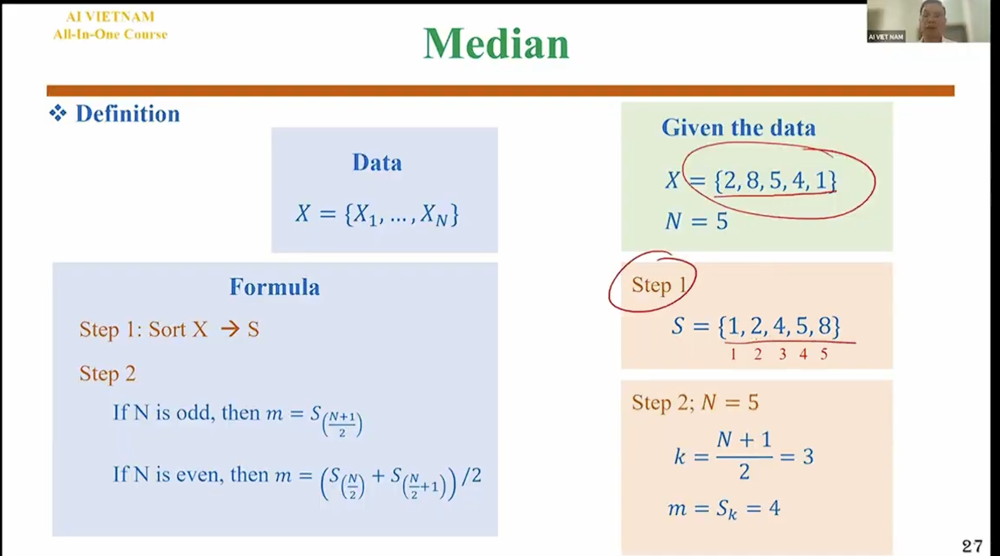
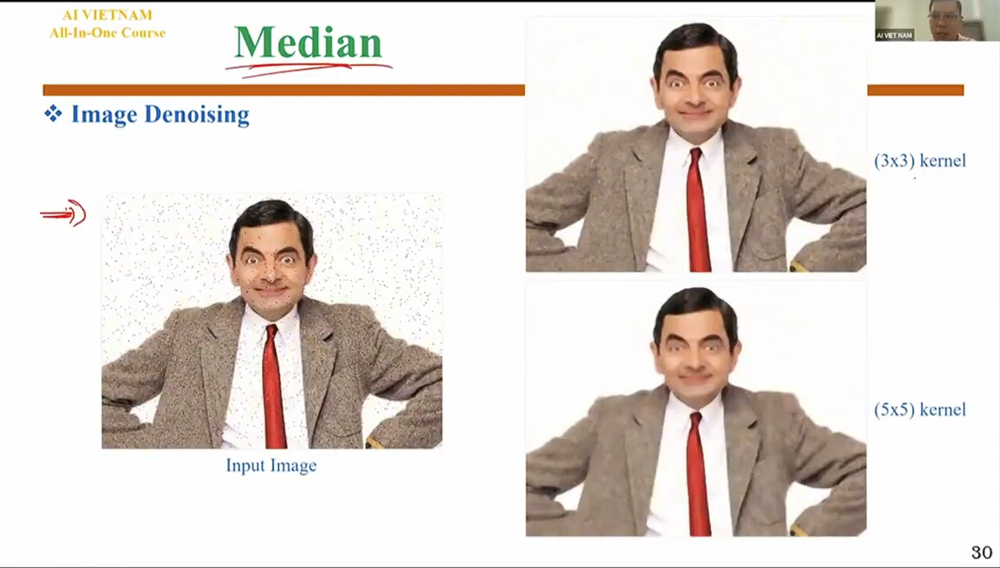

1. Tại sao Median lại khử nhiễu tốt hơn Mean?
- Nếu dùng Mean (Trung bình) như bài trước:
    - Mean sẽ cộng giá trị của điểm nhiễu (ví dụ màu trắng cực sáng 255) với các điểm xung quanh rồi chia đều.
    - Kết quả: Điểm nhiễu không mất đi mà bị "nhoè" ra, tạo thành vết mờ.
- Nếu dùng Median (Trung vị):
    - Nó lấy tất cả giá trị pixel trong khung cửa sổ (kernel), sắp xếp chúng theo thứ tự từ nhỏ đến lớn, rồi chọn số ở giữa.
    - Ví dụ: Bạn có một vùng da màu xám (giá trị khoảng 150) và 1 điểm nhiễu trắng (255). Dãy số sẽ là: [148, 149, 150, 150, 150, 151, 152, 152, 255].
    - Số ở giữa (Median) là 150 (màu da). Số 255 (nhiễu) bị loại bỏ hoàn toàn vì nó nằm ở rìa dãy số.
    - Kết quả: Nhiễu bị xóa sạch mà biên ảnh (cạnh khuôn mặt) vẫn giữ được độ sắc nét tốt hơn so với dùng Mean.

2. Ý nghĩa của kích thước Kernel (3x3 vs 5x5)
- (3x3) kernel: Cửa sổ trượt nhỏ. Khử được nhiễu hạt nhỏ, giữ lại được nhiều chi tiết nét của ảnh.
- (5x5) kernel: Cửa sổ trượt lớn hơn. Khử được nhiễu hạt to hơn hoặc dày đặc hơn, nhưng đổi lại ảnh sẽ trông "mịn" quá mức (giống tranh vẽ) và mất bớt chi tiết nhỏ.

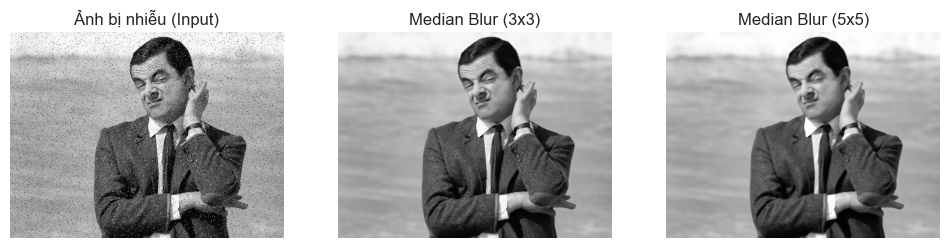

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Tạo ảnh nhiễu giả lập (Salt and Pepper) để test
def add_noise(image):
    row, col = image.shape
    s_vs_p = 0.5
    amount = 0.05 # Tỉ lệ nhiễu
    out = np.copy(image)
    
    # Tạo nhiễu muối (Salt - Trắng)
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    out[tuple(coords)] = 255

    # Tạo nhiễu tiêu (Pepper - Đen)
    num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    out[tuple(coords)] = 0
    return out

# Load ảnh thật
img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\mrbean.jpeg', 0)

if img is None:
    print("Không tìm thấy ảnh")
else:
    # Tạo ảnh nhiễu
    noisy_img = add_noise(img)

    # --- ÁP DỤNG MEDIAN BLUR ---
    median_3 = cv2.medianBlur(noisy_img, 3)
    median_5 = cv2.medianBlur(noisy_img, 5)

    # Hiển thị
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 3, 1)
    plt.imshow(noisy_img, cmap='gray')
    plt.title('Ảnh bị nhiễu (Input)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(median_3, cmap='gray')
    plt.title('Median Blur (3x3)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(median_5, cmap='gray')
    plt.title('Median Blur (5x5)')
    plt.axis('off')

    plt.show()

# (4) Variance
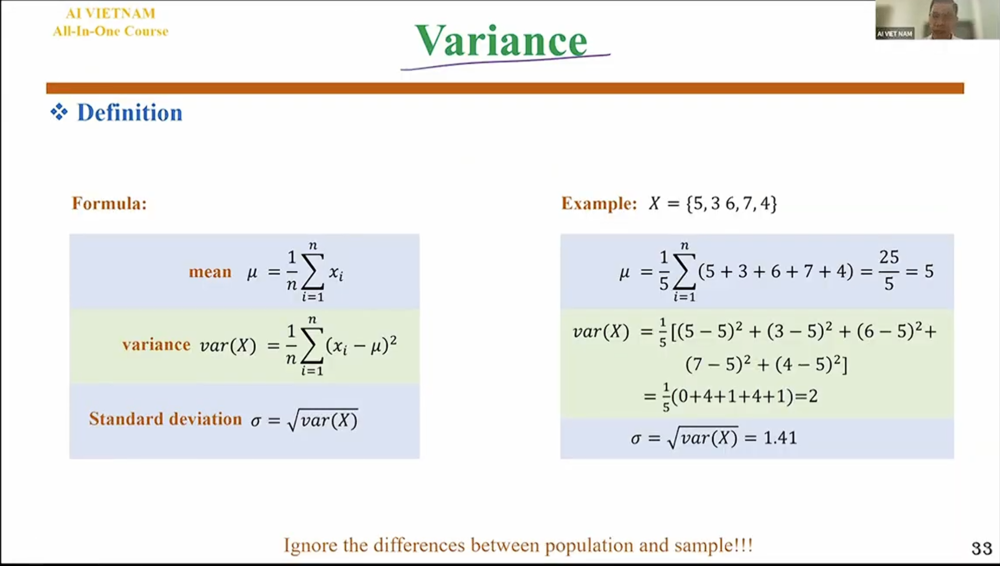
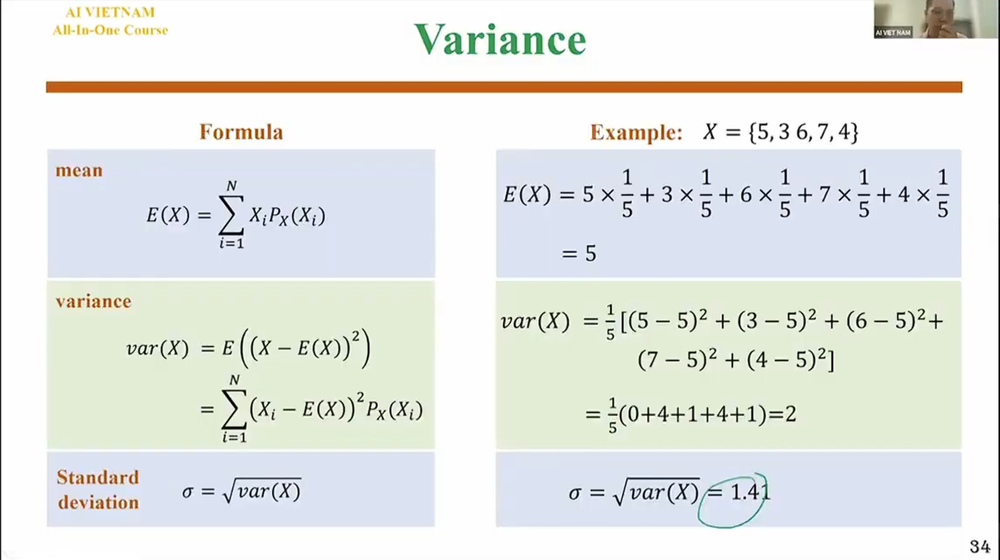
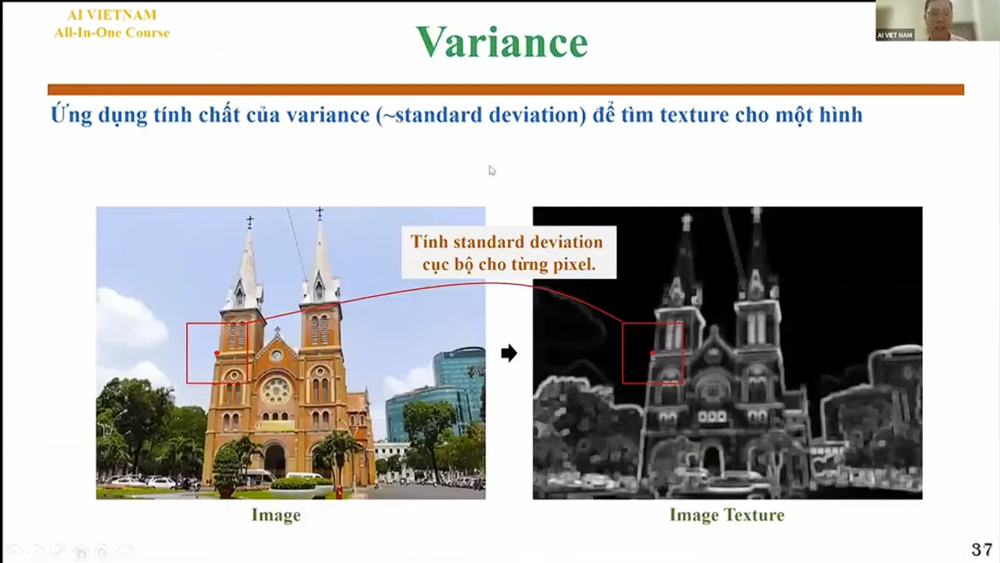

1. Nguyên lý hoạt động
- Variance/Standard Deviation đo lường độ phân tán của dữ liệu so với giá trị trung bình. Trong xử lý ảnh, ta tính toán chỉ số này cho một vùng nhỏ (cửa sổ/kernel) xung quanh từng pixel.
    - Vùng phẳng (Smooth/Uniform):
        - Ví dụ: Bầu trời, mặt đường láng.
        - Các pixel cạnh nhau có giá trị màu gần như y hệt nhau (ví dụ: 200, 201, 200).
        - Độ chênh lệch so với trung bình rất thấp $\rightarrow$ Variance thấp (gần 0).
        - Kết quả: Hiển thị màu Đen.
    - Vùng có kết cấu (Texture/Edge):
        - Ví dụ: Các ô cửa sổ, tán lá cây, viền gạch.
        - Các pixel cạnh nhau thay đổi giá trị liên tục và đột ngột (từ sáng sang tối và ngược lại).
        - Độ chênh lệch so với trung bình rất cao $\rightarrow$ Variance cao.
        - Kết quả: Hiển thị màu Trắng/Sáng.

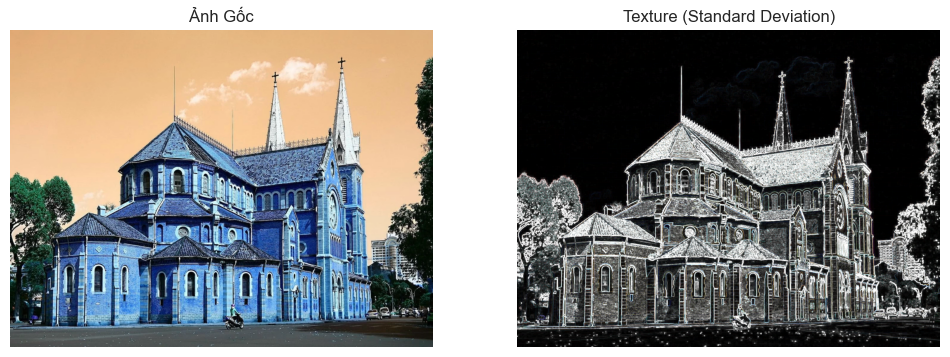

In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread(r'C:\Code_AI\AIO_Code\Module3\Statistics\unnamed.webp', 1)
img_float = img.astype(np.float32)

kernel = (3, 3)

mean_img = cv2.blur(img_float, kernel)

img_sq = img_float ** 2
mean_img_sq = cv2.blur(img_sq, kernel)

variance = mean_img_sq - (mean_img**2)
std_dev = np.sqrt(variance)

texture_view = np.uint8(np.clip(std_dev * 4.0, 0, 255))

plt.figure(figsize=(12, 6))
    
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Ảnh Gốc')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(texture_view)
plt.title('Texture (Standard Deviation)')
plt.axis('off')

plt.show()

# (5) Correlation Coefficient
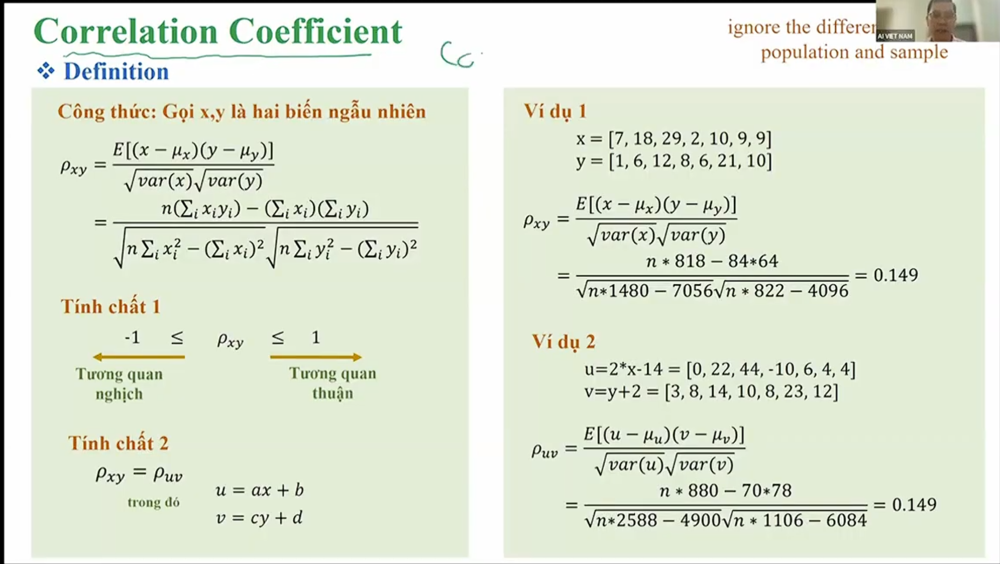
